In [1]:
# import packages
from astropy.io import fits
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from PIL import Image
from pandas import read_csv

# from lmfit import Model, fit_report
# from lmfit.models import LinearModel
from scipy.signal import argrelextrema

import os
import ipynbname
# notebook_path = os.path.abspath('h2_h3p_vel_compare.ipynb' + "/../")
# imgpath = os.path.join(os.path.dirname(notebook_path), 'plots/vprf')
nb_path = str(ipynbname.path())
plots_dir = os.path.join(os.path.abspath(nb_path + '/../../'), 'plots/vprf/')

"""
"""

h2_vprf = fits.open('h2_vprf.fits', ignore_missing_end=True)[0].data
h3p_vprf = fits.open('h3p_vprf.fits', ignore_missing_end=True)[0].data
h2_verr = fits.open('h2_verr.fits', ignore_missing_end=True)[0].data
h3p_verr = fits.open('h3p_verr.fits', ignore_missing_end=True)[0].data
h2_int = fits.open('h2_int_shifted.fits', ignore_missing_end=True)[0].data
h3p_int = fits.open('h3p_int_shifted.fits', ignore_missing_end=True)[0].data
ref_sun = fits.open('ref_sun.fits', ignore_missing_end=True)[0].data

lat = fits.open('latit.fits', ignore_missing_end=True)[0].data
long = fits.open('longit.fits', ignore_missing_end=True)[0].data

cmlsel = read_csv('cml-sel.txt', sep='\s+', header=None)
cml = cmlsel[3].to_numpy()
sel = cmlsel[4].to_numpy()

vmp = 3.41*np.sin((185-cml)*(np.pi/180))*np.cos((sel)*(np.pi/180))

h2_vprf[h2_verr > 4] = np.nan
h3p_vprf[h3p_verr > 4] = np.nan

h2_vprf[h2_vprf > 4] = np.nan
h3p_vprf[h3p_vprf > 4] = np.nan
h2_vprf[h2_vprf < -4] = np.nan
h3p_vprf[h3p_vprf < -4] = np.nan

h2_vprf[:,:20] = np.nan
h3p_vprf[:,:20] = np.nan
h2_vprf[:,280:] = np.nan
h3p_vprf[:,280:] = np.nan

h2_verr[np.isnan(h2_vprf)] = np.nan
h3p_verr[np.isnan(h3p_vprf)] = np.nan
h2_int[np.isnan(h2_vprf)] = np.nan
h3p_int[np.isnan(h3p_vprf)] = np.nan

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


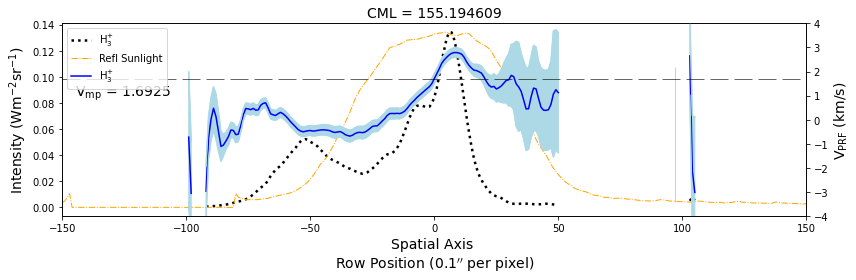

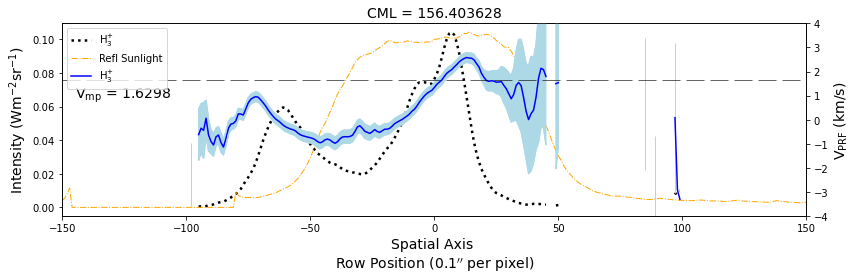

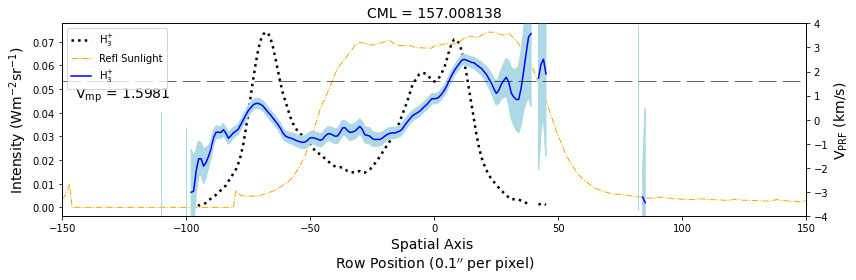

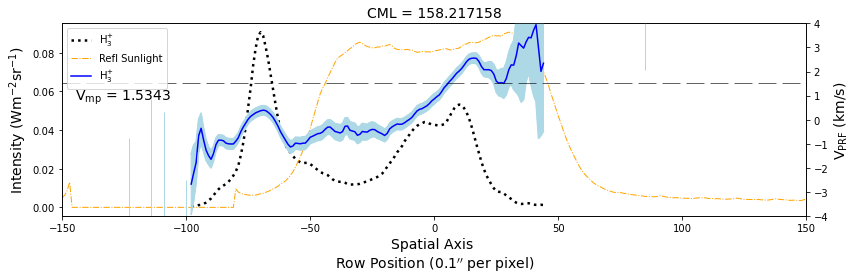

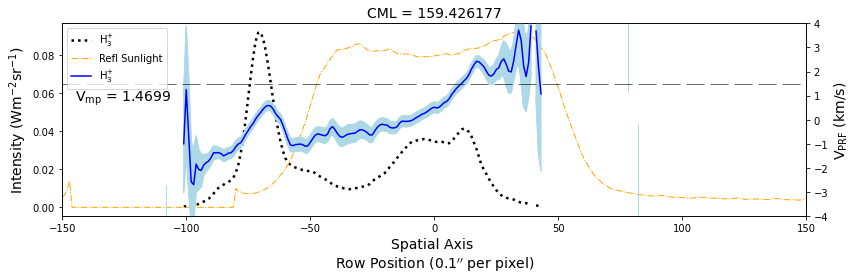

...

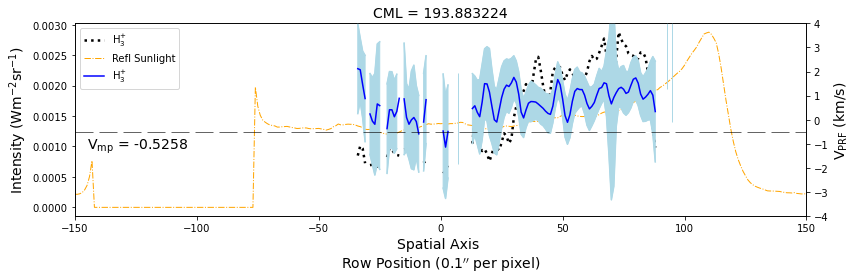

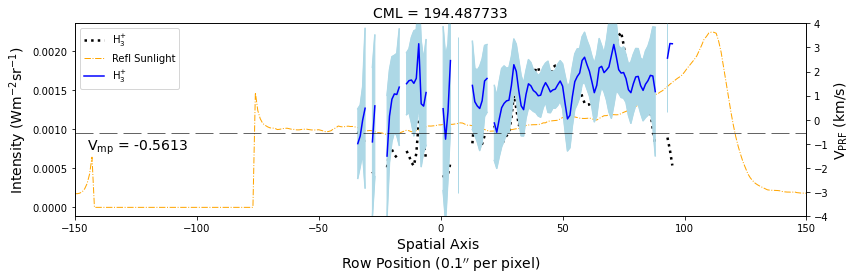

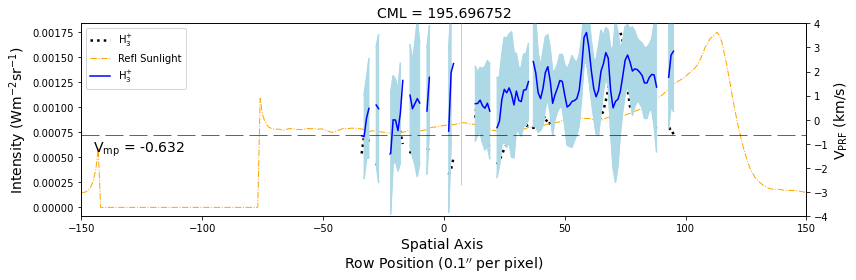

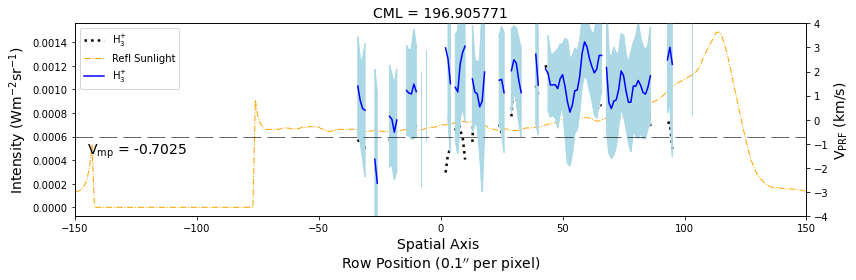

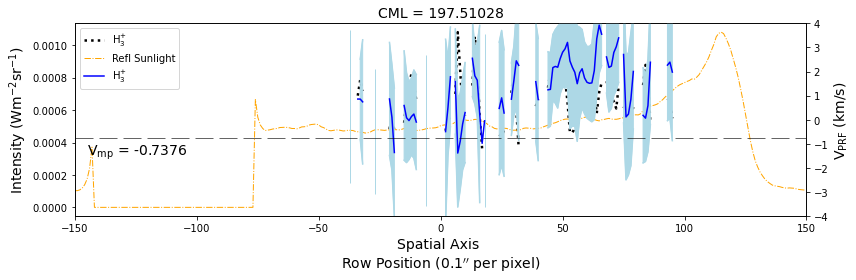

In [68]:
ang_diam = 40.58867
ang_diam/(0.1)
limb_vel = 12.572
vel_slope = limb_vel * 2 / (ang_diam/(0.1))

x = np.linspace(-150,150,301)
rot_rate = vel_slope * x
rot_rate = rot_rate - rot_rate[150]

a2 = h2_vprf*(-1)
b2 = h3p_vprf*(-1)

c2 = b2 - a2
errc2 = np.sqrt((h3p_verr)**2 + (h2_verr)**2)

for i in range(len(h3p_vprf)):
# for i in range(18, 19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vh2 = a2[i]
        vh2max = a2[i] + h2_verr[i]
        vh2min = a2[i] - h2_verr[i]
        
        vh3p = b2[i]
        vh3pmax = b2[i] + h3p_verr[i]
        vh3pmin = b2[i] - h3p_verr[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
#         ax2.plot(xnew, vh2, color='red', label='H$_2$')        
#         ax2.plot(xnew, vh2max, color='mistyrose')
#         ax2.plot(xnew, vh2min, color='mistyrose')
#         ax2.fill_between(xnew, vh2min, vh2max, color='mistyrose')
        
        ax2.plot(xnew, vh3p, color='blue', label='H$_3^{+}$')
        ax2.plot(xnew, vh3pmax, color='lightblue')
        ax2.plot(xnew, vh3pmin, color='lightblue')
        ax2.fill_between(xnew, vh3pmin, vh3pmax, color='lightblue')
        
#         ax2.plot(xnew, -rot_rate, color='black', ls='dashed', dashes=(30, 10), lw=1)
        
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='r', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='b', ecolor='lightblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c2[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        
#         plt.figure(figsize=(12,4))
#         plt.plot(a2[num], label='H2')
#         plt.plot(b2[num], label='H3+')
#         plt.plot(xnew, int2[i], color='teal', ls='-', label='H$_3^{+}$ - Int')
#         plt.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='gray', label='H$_2$')
#         plt.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        plt.axhline(y=vmp[i], color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.text(-145,vmp[i]-0.7, 'V$_{\mathrm{mp}}$ = '+str(round(vmp[i], 4)), fontsize=14)
#         plt.axhline(y=0, xmin=0, xmax=250, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-4,4)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=2)
        
        plt.tight_layout()
        plt.savefig(plots_dir+'/h3p_vprf_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


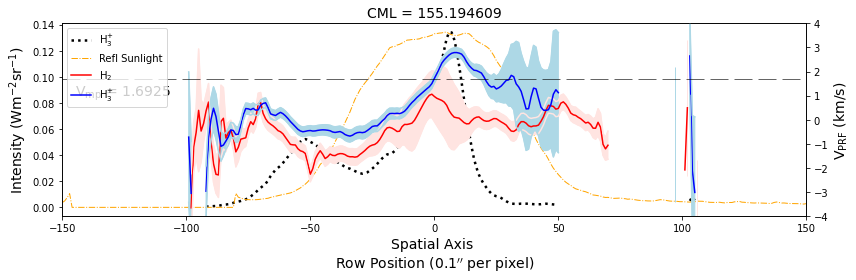

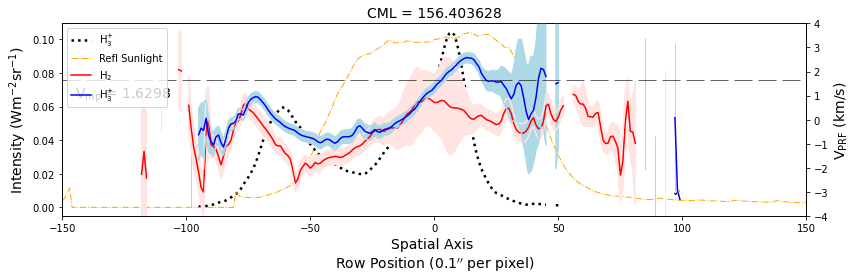

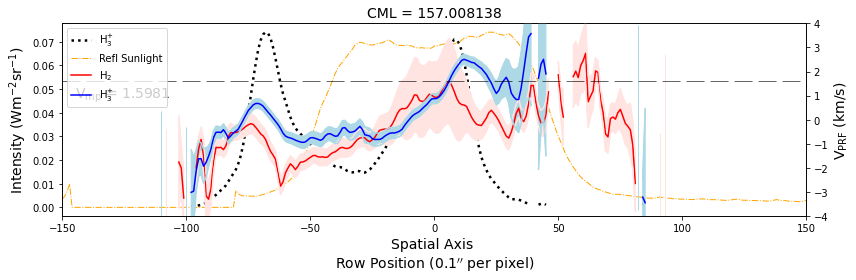

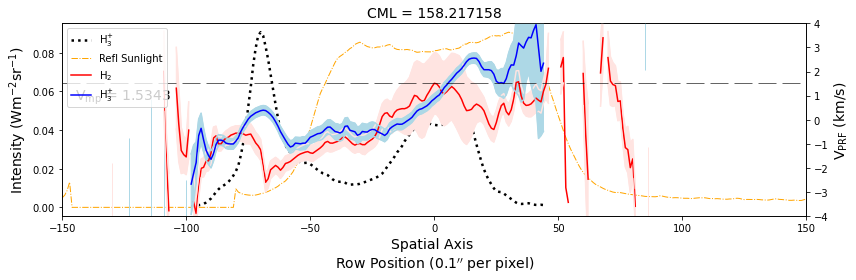

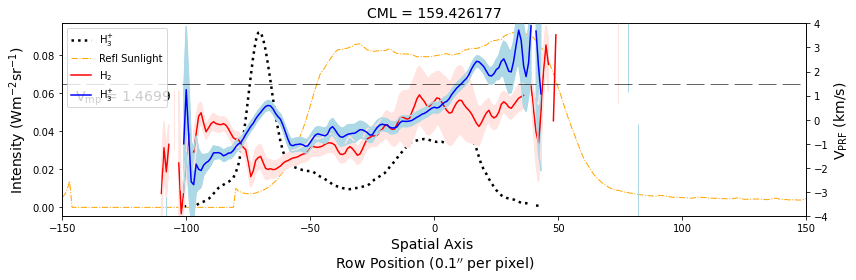

...

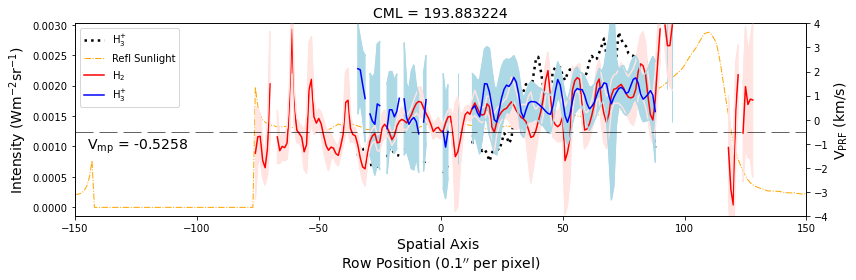

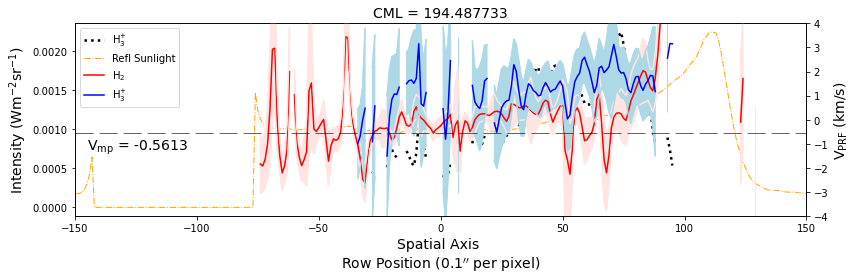

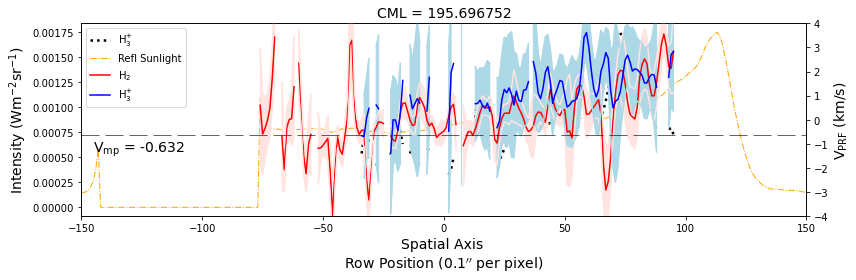

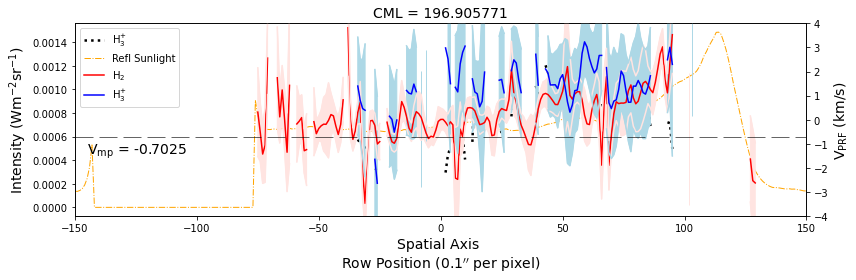

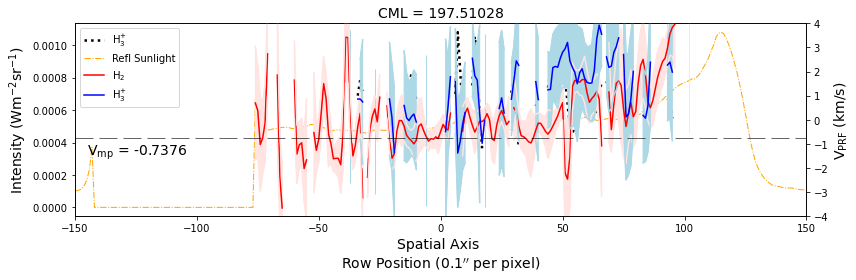

In [69]:
ang_diam = 40.58867
ang_diam/(0.1)
limb_vel = 12.572
vel_slope = limb_vel * 2 / (ang_diam/(0.1))

x = np.linspace(-150,150,301)
rot_rate = vel_slope * x
rot_rate = rot_rate - rot_rate[150]

a2 = h2_vprf*(-1)
b2 = h3p_vprf*(-1)

for i in range(len(h3p_vprf)):
# for i in range(18, 19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vh2 = a2[i]
        vh2max = a2[i] + h2_verr[i]
        vh2min = a2[i] - h2_verr[i]
        
        vh3p = b2[i]
        vh3pmax = b2[i] + h3p_verr[i]
        vh3pmin = b2[i] - h3p_verr[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vh2, color='red', label='H$_2$')        
        ax2.plot(xnew, vh2max, color='mistyrose')
        ax2.plot(xnew, vh2min, color='mistyrose')
        ax2.fill_between(xnew, vh2min, vh2max, color='mistyrose')
        
        ax2.plot(xnew, vh3p, color='blue', label='H$_3^{+}$')
        ax2.plot(xnew, vh3pmax, color='lightblue')
        ax2.plot(xnew, vh3pmin, color='lightblue')
        ax2.fill_between(xnew, vh3pmin, vh3pmax, color='lightblue')
        
#         ax2.plot(xnew, -rot_rate, color='black', ls='dashed', dashes=(30, 10), lw=1)
        
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='r', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='b', ecolor='lightblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c2[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        
#         plt.figure(figsize=(12,4))
#         plt.plot(a2[num], label='H2')
#         plt.plot(b2[num], label='H3+')
#         plt.plot(xnew, int2[i], color='teal', ls='-', label='H$_3^{+}$ - Int')
#         plt.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='gray', label='H$_2$')
#         plt.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        plt.axhline(y=vmp[i], color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.text(-145,vmp[i]-0.7, 'V$_{\mathrm{mp}}$ = '+str(round(vmp[i], 4)), fontsize=14)
#         plt.axhline(y=0, xmin=0, xmax=250, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-4,4)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=2)
        
        plt.tight_layout()
        plt.savefig(plots_dir+'/h2_h3p_vprf_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

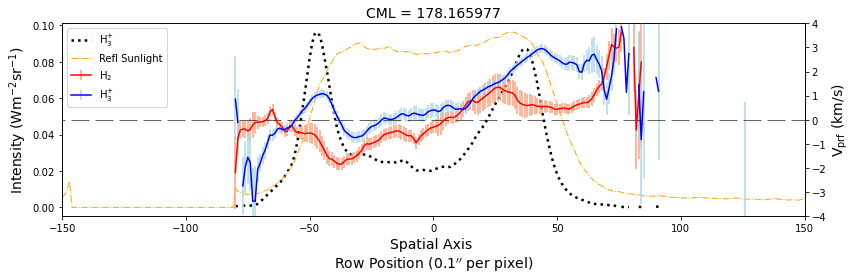

In [21]:
for i in range(18,19):
# for i in range(2):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4), facecolor='white')
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        ax2 = ax.twinx()
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='r', ecolor='lightsalmon', label='H$_2$')
        ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='b', ecolor='lightblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c2[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{prf}}$ (km/s)', fontsize=14)
        
#         plt.figure(figsize=(12,4))
#         plt.plot(a2[num], label='H2')
#         plt.plot(b2[num], label='H3+')
#         plt.plot(xnew, int2[i], color='teal', ls='-', label='H$_3^{+}$ - Int')
#         plt.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='gray', label='H$_2$')
#         plt.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        plt.axhline(y=0, xmin=-150, xmax=150, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-4,4)
#         plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
#         plt.ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=2)
        
        plt.tight_layout()
#         plt.savefig(plots_dir+'/h2_h3p_int_vel_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')
#         plt.savefig(plots_dir+'/h2_h3p_int_vel_fr'+str(i), dpi=400, bbox_inches='tight', facecolor='white')

In [40]:
peak1 = np.zeros(38)
peak2 = np.zeros(38)

for i in range(len(h3p_int)):
    x = h3p_int[i]
    skip = [0,13,15,16,29,37]
    if i not in skip and i < 15:
        # print('i = ' + str(i))
        # print(argrelextrema(x[0:110], np.greater))
        # print(argrelextrema(x[75:110], np.greater)[0][0]+75)
        peak1[i] = argrelextrema(x[75:110], np.greater)[0][0]+75
    if i == 13:
        # print('i = ' + str(i))
        # print(argrelextrema(x[0:110], np.greater))
        peak1[i] = 100
    if i not in skip and i > 14 and i < 24:
        # print('i = ' + str(i))
        # print(argrelextrema(x[0:160], np.greater))
        # print(argrelextrema(x[90:160], np.greater)[0][0]+90)
        peak1[i] = argrelextrema(x[90:160], np.greater)[0][0]+90
    if i not in skip and i > 23 and i < 26:
        # print('i = ' + str(i))
        # print(argrelextrema(x[0:160], np.greater))
        # print(argrelextrema(x[115:160], np.greater)[0][0]+115)
        peak1[i] = argrelextrema(x[115:160], np.greater)[0][0]+115
    if i not in skip and i > 25 and i < 29:
        # print('i = ' + str(i))
        # print(argrelextrema(x[0:200], np.greater))
        # print(argrelextrema(x[180:200], np.greater)[0][0]+180)
        peak1[i] = argrelextrema(x[180:200], np.greater)[0][0]+180
    if i == 29:
        # print('i = ' + str(i))
        # print(argrelextrema(x[0:200], np.greater))
        peak1[i] = 190
    if i not in skip and i > 29 and i < 32:
        # print('i = ' + str(i))
        # print(argrelextrema(x[0:200], np.greater))
        # print(argrelextrema(x[192:200], np.greater)[0][0]+192)
        peak1[i] = argrelextrema(x[192:200], np.greater)[0][0]+192
    if i not in skip and i > 31:
        peak1[i] = np.nan

peak1[peak1<1] = np.nan

for i in range(len(h3p_int)):
    y = h3p_int[i]
    skip = [0,15,16,37]
    if i not in skip and i < 9:
        # print('i = ' + str(i))
        # print(argrelextrema(y[0:200], np.greater))
        # print(argrelextrema(y[152:200], np.greater)[0][0]+152)
        peak2[i] = argrelextrema(y[152:200], np.greater)[0][0]+152
    if i not in skip and i >= 9 and i < 15:
        # print('i = ' + str(i))
        # print(argrelextrema(y[0:200], np.greater))
        # print(argrelextrema(y[145:180], np.greater)[0][0]+145)
        peak2[i] = argrelextrema(y[145:180], np.greater)[0][0]+145
    if i not in skip and i >= 15 and i < 24:
        # print('i = ' + str(i))
        # print(argrelextrema(y[0:240], np.greater))
        # print(argrelextrema(y[182:220], np.greater)[0][0]+182)
        peak2[i] = argrelextrema(y[182:220], np.greater)[0][0]+182
    if i not in skip and i >= 24 and i < 30:
        # print('i = ' + str(i))
        # print(argrelextrema(y[0:240], np.greater))
        # print(argrelextrema(y[203:240], np.greater)[0][0]+203)
        peak2[i] = argrelextrema(y[203:240], np.greater)[0][0]+203
    if i not in skip and i >= 30 and i < 32:
        # print('i = ' + str(i))
        # print(argrelextrema(y[0:240], np.greater))
        # print(argrelextrema(y[211:240], np.greater)[0][0]+211)
        peak2[i] = argrelextrema(y[211:240], np.greater)[0][0]+211
    if i == 32:
        # print('i = ' + str(i))
        # print(argrelextrema(y[0:240], np.greater))
        peak2[i] = 216
    if i not in skip and i >= 33 and i < 35:
        # print('i = ' + str(i))
        # print(argrelextrema(y[0:240], np.greater))
        # print(argrelextrema(y[214:240], np.greater)[0][0]+214)
        peak2[i] = argrelextrema(y[214:240], np.greater)[0][0]+214
    if i not in skip and i >= 35:
        peak2[i] = np.nan
    
peak2[peak2<1] = np.nan
# peak2

peak1[26:] = np.nan
peak2[28:] = np.nan
peak1[11:16] = np.nan
peak2[10:16] = np.nan
# peak2

# for i in range(len(h3p_int)):
#     y = h3p_int[i]
#     skip = [0,15,16,37]
#     if i not in skip and i >= 33 and i < 35:
#         # print('i = ' + str(i))
#         # print(argrelextrema(y[0:240], np.greater))
#         # print(argrelextrema(y[214:240], np.greater)[0][0]+214)

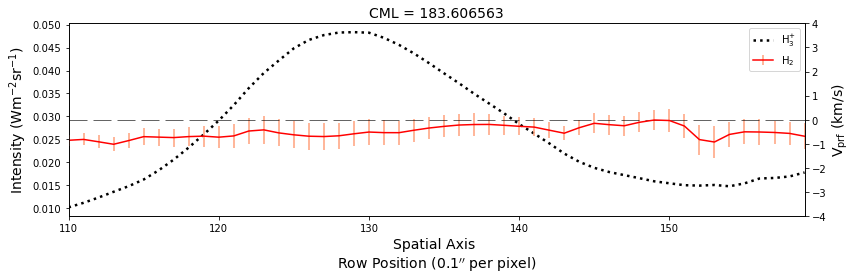

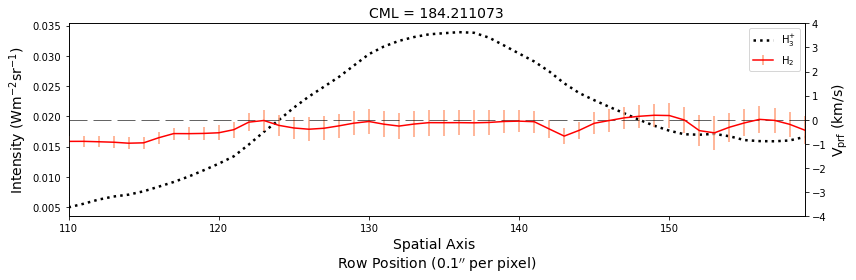

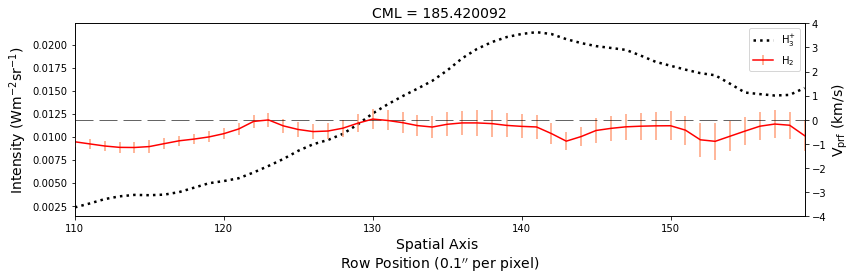

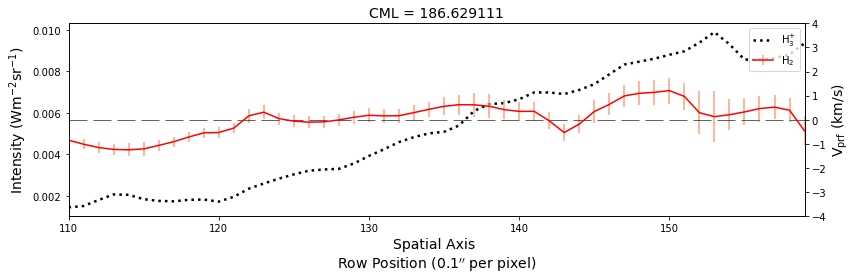

In [7]:
a2 = h2_vprf*(-1)
b2 = h3p_vprf*(-1)

c2 = b2 - a2
errc2 = np.sqrt((h3p_verr)**2 + (h2_verr)**2)

for i in range(len(h3p_vprf)):
# for i in range(2):
    if i not in (0,15,16,37) and i>=23 and i<27:  
        xnew = np.linspace(0,300,301)[110:160]
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        ax2 = ax.twinx()
        ax.plot(xnew, h3p_int[i][110:160], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
#         ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        ax2.errorbar(xnew, a2[i][110:160], yerr=h2_verr[i][110:160], color='r', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='b', ecolor='lightblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c2[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{prf}}$ (km/s)', fontsize=14)
        
#         plt.figure(figsize=(12,4))
#         plt.plot(a2[num], label='H2')
#         plt.plot(b2[num], label='H3+')
#         plt.plot(xnew, int2[i], color='teal', ls='-', label='H$_3^{+}$ - Int')
#         plt.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='gray', label='H$_2$')
#         plt.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        plt.axhline(y=0, xmin=0, xmax=250, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(xnew[0], xnew[-1])
        plt.ylim(-4,4)
#         plt.xlabel('Spatial Axis \nRaw Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
#         plt.ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=0)
        
        plt.tight_layout()
#         plt.savefig(plots_dir+'/h2_dawn_'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


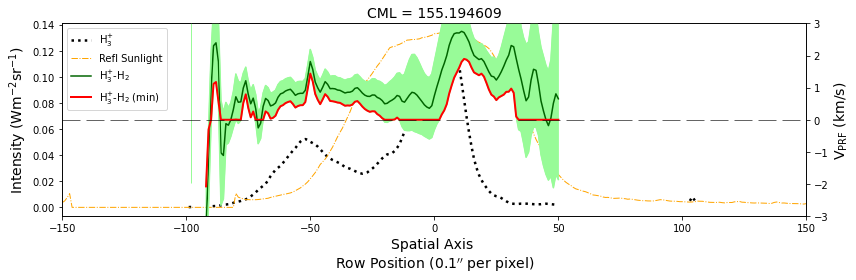

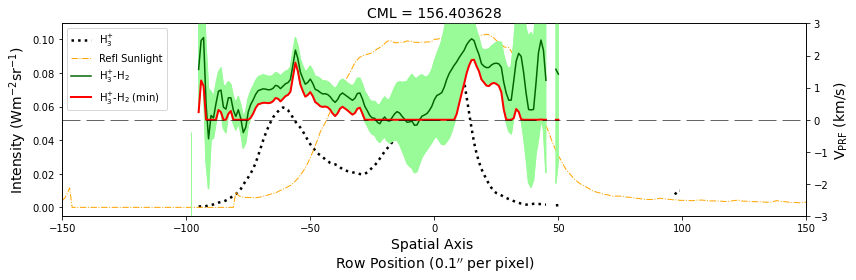

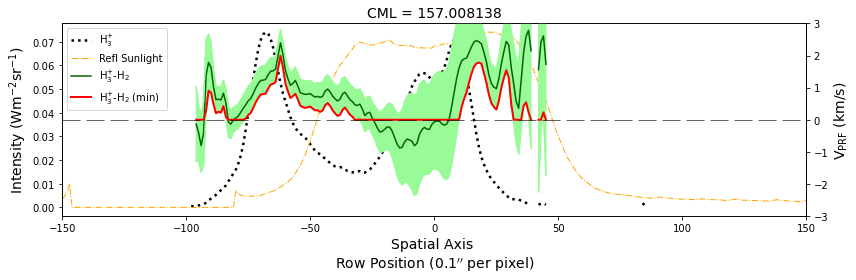

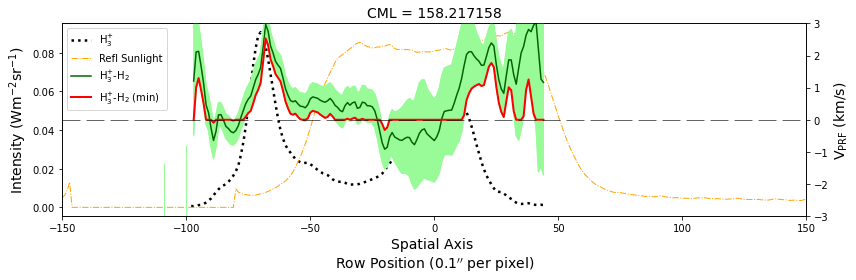

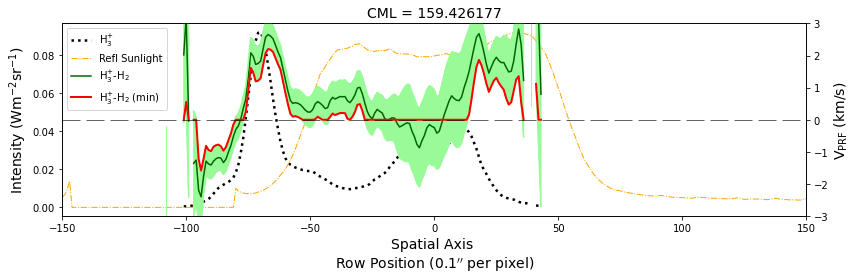

...

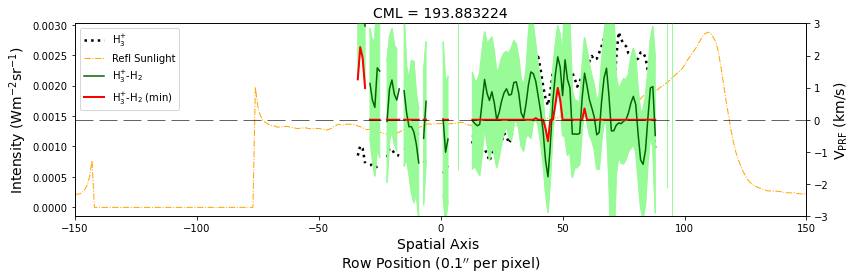

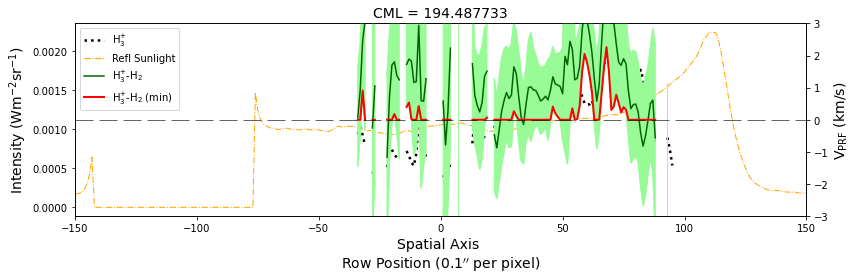

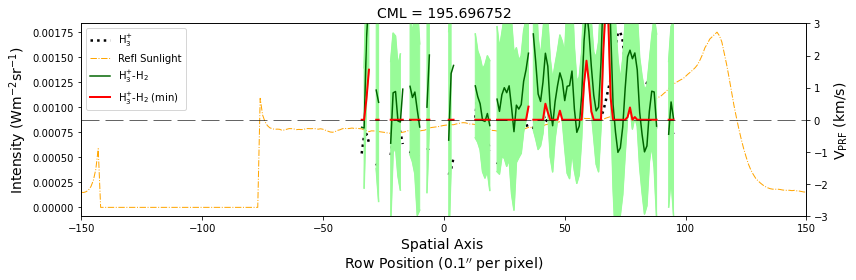

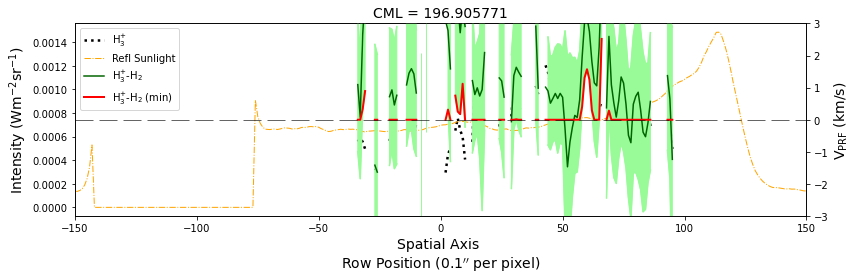

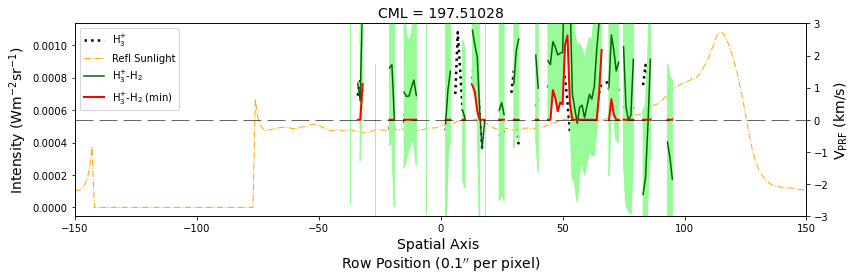

In [70]:
c2 = b2 - a2
errc2 = np.sqrt((h3p_verr)**2 + (h2_verr)**2)

c3 = c2 + 0
c_min = c2 - errc2
c_max = c2 + errc2
c_max_t = c3/c_max
c_min_t = c3/c_min
c_max_t[c_max_t <0] = 0
c_min_t[c_min_t <0] = 0
m3 = c_max_t * c_min_t

m3[m3 > 0] = 1

d3 = c3 * m3
d3a = c_min * m3
d3b = c_max * m3

e3 = c3 *0
e3[d3 > 0] = c_min[d3 > 0]
e3[d3 < 0] = c_max[d3 < 0]

for i in range(len(h3p_vprf)):
# for i in range(18,19):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
#         int2 = (h3p_int/np.nanmax(h3p_int[i])*7.9-3.95)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        vcur = c2[i]
        vcurmax = c2[i] + errc2[i]
        vcurmin = c2[i] - errc2[i]
        
        ax2 = ax.twinx()
        
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
        
        ax2.plot(xnew, vcur, color='darkgreen', label='H$_3^{+}$-H$_2$')        
        ax2.plot(xnew, vcurmax, color='palegreen')
        ax2.plot(xnew, vcurmin, color='palegreen')
        ax2.fill_between(xnew, vcurmin, vcurmax, color='palegreen')
        
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='palesalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='paleblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, c3[i], yerr=errc2[i], color='green', ecolor='palegreen', label='H$_3^{+}$-H$_2$')
        ax2.plot(xnew, e3[i], color='red', ls='-', label='H$_3^{+}$-H$_2$ (min)', lw=2)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        plt.axhline(y=0, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-3,3)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=2)
        
        plt.tight_layout()
        plt.savefig(plots_dir+'/h2_h3p_curr_fr'+str(i)+'.pdf', dpi=400, bbox_inches='tight', facecolor='white')

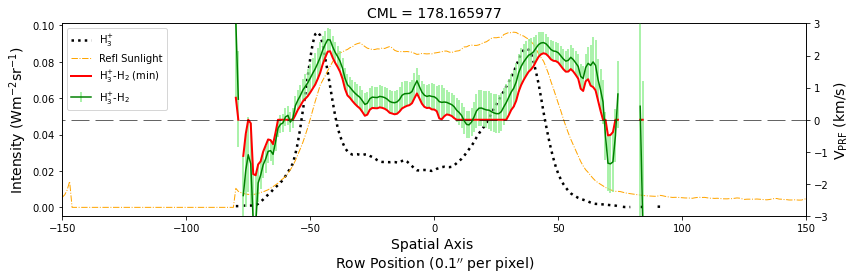

In [133]:
for i in range(18,19):
# for i in range(2):
    if i not in (0,15,16,37):  
        xnew = np.linspace(-150,150,301)
#         int2 = (h3p_int/np.nanmax(h3p_int[i])*7.9-3.95)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('CML = '+ str(cml[i]), fontsize=14)
        
        ax2 = ax.twinx()
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        ax2.errorbar(xnew, c3[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')
        ax2.plot(xnew, e3[i], color='red', ls='-', label='H$_3^{+}$-H$_2$ (min)', lw=2)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        plt.axhline(y=0, xmin=-150, xmax=150, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(-150,150)
        plt.ylim(-3,3)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=2)
        
        plt.tight_layout()
#         plt.savefig(plots_dir+'/h2_h3p_curr_fr'+str(i), dpi=400, bbox_inches='tight', facecolor='white')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:102: UserWarning: Warning: converting a masked element to n

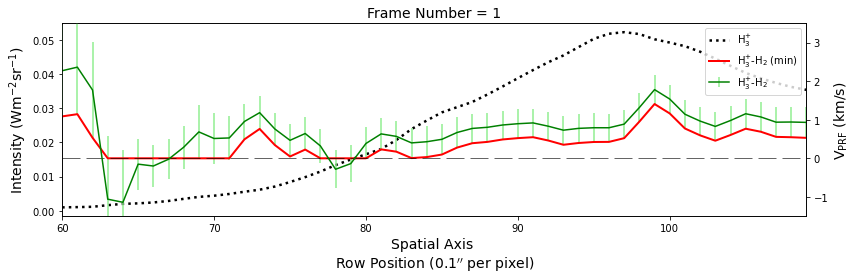

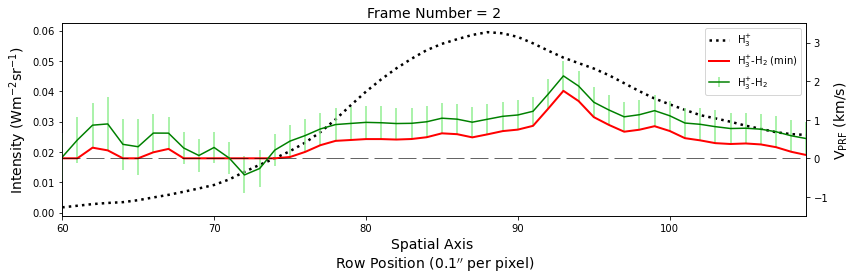

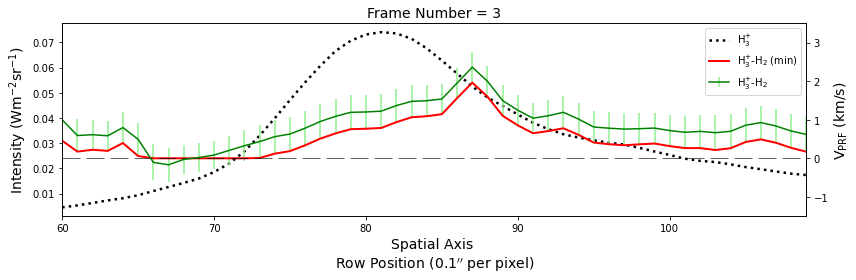

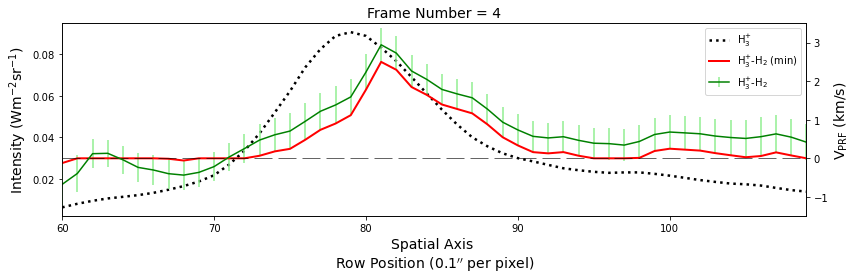

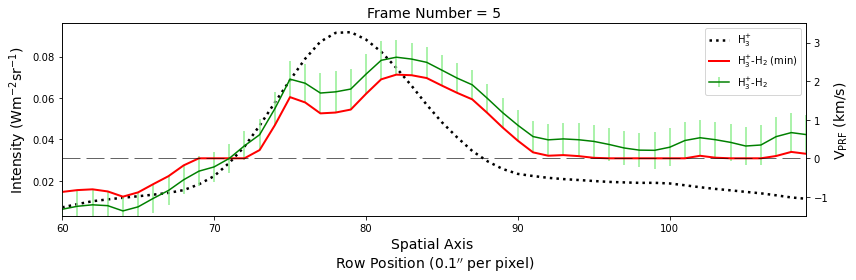

...

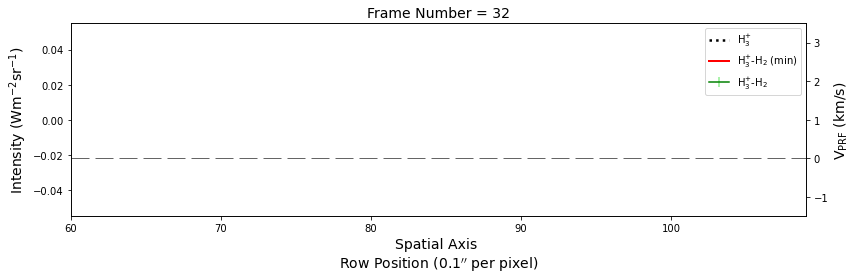

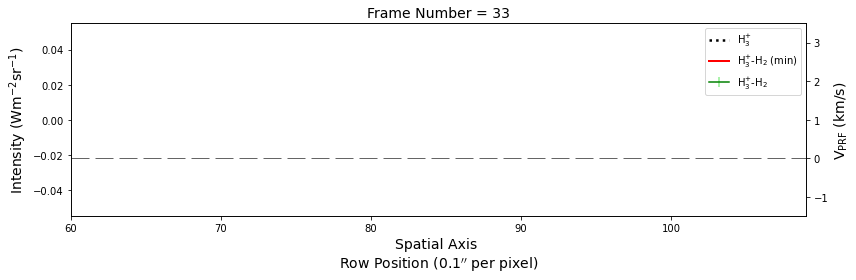

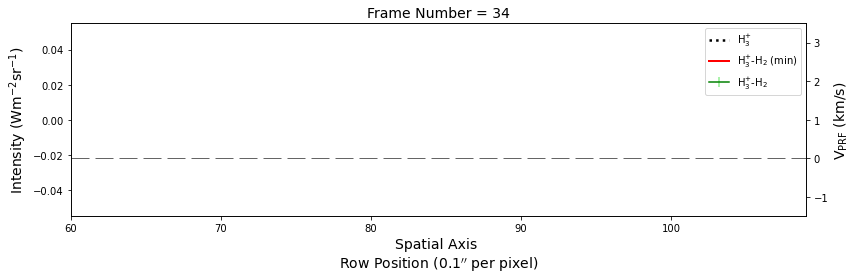

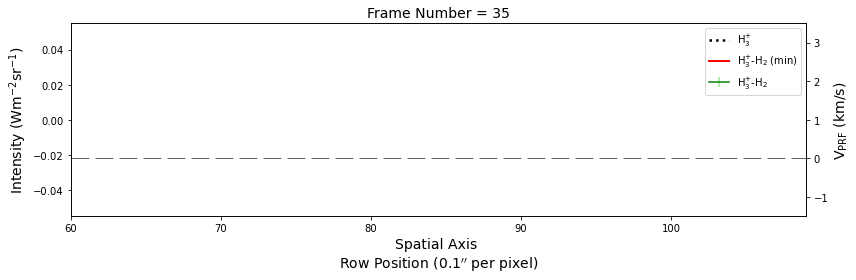

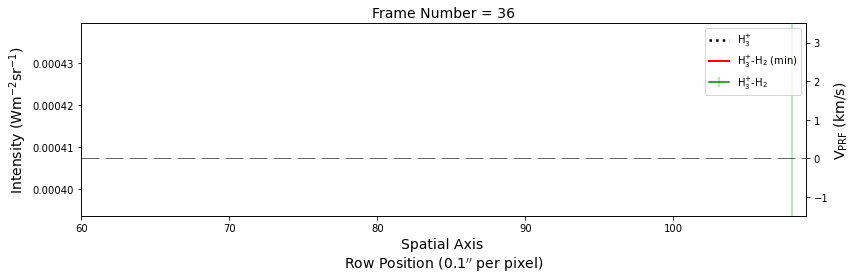

In [17]:
c3 = c2 + 0
c_min = c2 - errc2
c_max = c2 + errc2
c_max_t = c3/c_max
c_min_t = c3/c_min
c_max_t[c_max_t <0] = 0
c_min_t[c_min_t <0] = 0
m3 = c_max_t * c_min_t

m3[m3 > 0] = 1

d3 = c3 * m3
d3a = c_min * m3
d3b = c_max * m3

e3 = c3 *0
e3[d3 > 0] = c_min[d3 > 0]
e3[d3 < 0] = c_max[d3 < 0]

for i in range(len(h3p_vprf)):
# for i in range(2):
    if i not in (0,15,16,37) and i < 16:  
        xnew = np.linspace(0,299,300)[60:110]
#         int2 = (h3p_int/np.nanmax(h3p_int[i])*7.9-3.95)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('Frame Number = '+ str(i), fontsize=14)
        
        ax2 = ax.twinx()
        ax.plot(xnew, h3p_int[i][60:110], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
#         ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        ax2.errorbar(xnew, c3[i][60:110], yerr=errc2[i][60:110], color='green', ecolor='lightgreen', label='H$_3^{+}$-H$_2$')
        ax2.plot(xnew, e3[i][60:110], color='red', ls='-', label='H$_3^{+}$-H$_2$ (min)', lw=2)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        plt.axhline(y=0, xmin=0, xmax=250, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(xnew[0],xnew[-1])
#         plt.ylim(-4,4)
        plt.ylim(-1.5,3.5)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=0)
        
        plt.tight_layout()
#         plt.savefig(plots_dir + '/h2_h3p_curr_fr' +str(i), dpi=400, bbox_inches='tight', facecolor='white')

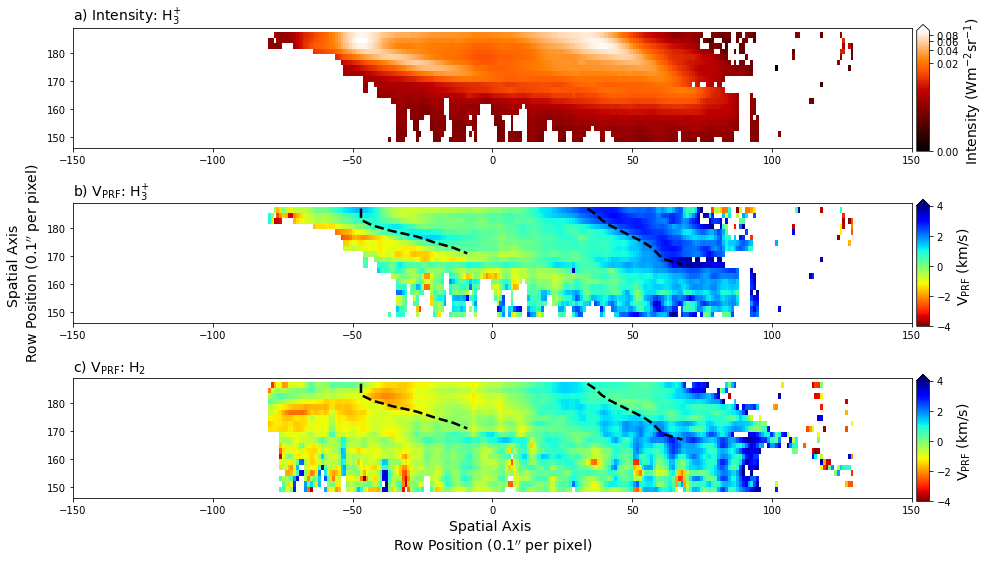

In [80]:
h3p_int2 = np.delete(h3p_int, np.s_[:16], axis=0)
h3p_vprf2 = np.delete(b2, np.s_[:16], axis=0)
h2_vprf2 = np.delete(a2, np.s_[:16], axis=0)
curr2 = np.delete(c3, np.s_[:16], axis=0)
curr_min2 = np.delete(e3, np.s_[:16], axis=0)

h3p_int_rs = np.array(Image.fromarray(h3p_int2).resize(size=(301, 44), resample=0))
h3p_vprf_rs = np.array(Image.fromarray(h3p_vprf2).resize(size=(301, 44), resample=0))
h2_vprf_rs = np.array(Image.fromarray(h2_vprf2).resize(size=(301, 44), resample=0))
curr_rs = np.array(Image.fromarray(curr2).resize(size=(301, 44), resample=0))
curr_min_rs = np.array(Image.fromarray(curr_min2).resize(size=(301, 44), resample=0))

peak11 = np.delete(peak1, np.s_[:16], axis=0)
peak22 = np.delete(peak2, np.s_[:16], axis=0)

fig = plt.figure(figsize=(15,8), tight_layout=True, facecolor='white')

fig.add_subplot(311)
plt.imshow(h3p_int_rs, 
           aspect='equal', 
           interpolation='none', 
           cmap='gist_heat',
           extent=[-150, 150, 146.0669, 189.0669], 
           norm=colors.PowerNorm(gamma=0.2))
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
# plt.ylabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
plt.title('a) Intensity: H$_3^{+}$', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=10, pad=0.005, shrink=0.75).set_label(label='Intensity (Wm$^{-2}$sr$^{-1}$)',size=14)

fig.add_subplot(312)
plt.imshow(h3p_vprf_rs, 
           aspect='equal', 
           interpolation='none', 
           cmap='jet_r', 
           extent=[-150, 150, 146.0669, 189.0669], 
           vmin=-4, 
           vmax=4)
plt.plot(peak11-150, range(189, 190-len(peak11)*2, -2), ls='--', lw=2.5, color='black')
plt.plot(peak22-150, range(189, 190-len(peak22)*2, -2), ls='--', lw=2.5, color='black')
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
plt.ylabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
# plt.ylabel('Temporal Axis \nRow Position (0.1$^{\prime\prime}$ / pixel)', fontsize=16)
plt.title('b) V$_{\mathrm{PRF}}$: H$_3^{+}$', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=10, pad=0.005, shrink=0.75).set_label(label='V$_{\mathrm{PRF}}$ (km/s)',size=14)

fig.add_subplot(313)
plt.imshow(h2_vprf_rs, 
           aspect='equal', 
           interpolation='none', 
           cmap='jet_r',
           extent=[-150, 150, 146.0669, 189.0669],
           vmin=-4, 
           vmax=4)
plt.plot(peak11-150, range(189, 190-len(peak11)*2, -2), ls='--', lw=2.5, color='black')
plt.plot(peak22-150, range(189, 190-len(peak22)*2, -2), ls='--', lw=2.5, color='black')
plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
# plt.ylabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
plt.title('c) V$_{\mathrm{PRF}}$: H$_2$', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=10, pad=0.005, shrink=0.75).set_label(label='V$_{\mathrm{PRF}}$ (km/s)',size=14)

# fig.supxlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
# fig.supylabel('Frame Number', fontsize=14)
plt.savefig(plots_dir+'/h2_h3p_int_vel_map.pdf', dpi=400, bbox_inches='tight', facecolor='white')

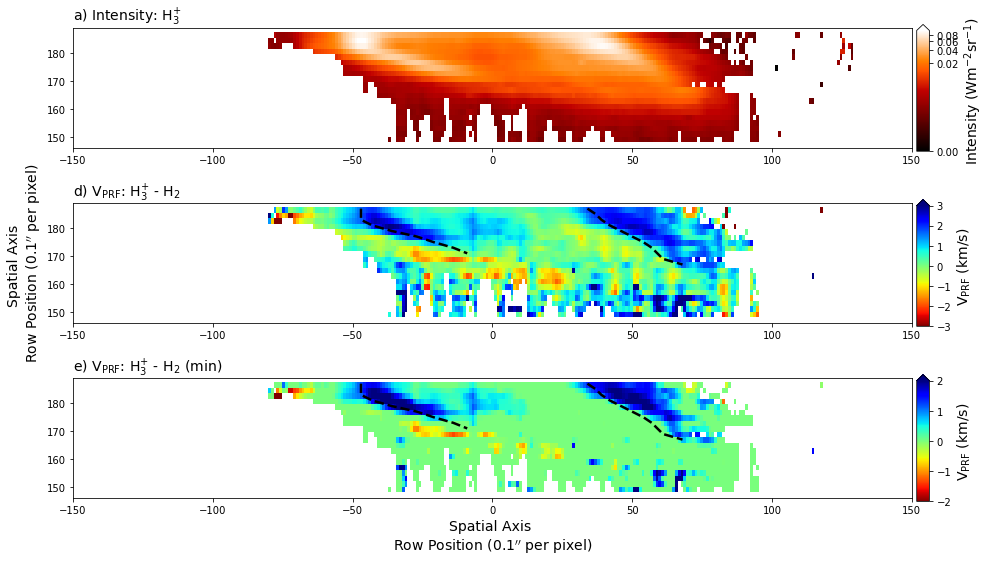

In [81]:
fig = plt.figure(figsize=(15,8), tight_layout=True, facecolor='white')

fig.add_subplot(311)
plt.imshow(h3p_int_rs, 
           aspect='equal', 
           interpolation='none', 
           cmap='gist_heat',
           extent=[-150, 150, 146.0669, 189.0669], 
           norm=colors.PowerNorm(gamma=0.2))
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
# plt.ylabel('CML (degrees)', fontsize=14)
plt.title('a) Intensity: H$_3^{+}$', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=10, pad=0.005, shrink=0.75).set_label(label='Intensity (Wm$^{-2}$sr$^{-1}$)',size=14)

# plt.contour(lat, np.linspace(-90, 90, 19), colors='blue', origin='upper', extent=[-150, 150, 145.0669, 189.0669])
# plt.contour(long, np.linspace(0,360,25), colors='cyan', origin='upper', extent=[-150, 150, 145.0669, 189.0669])
# plt.contour(long, np.linspace(0,360,5), colors='blue', origin='upper', extent=[-150, 150, 145.0669, 189.0669])

fig.add_subplot(312)
plt.imshow(curr_rs, 
           aspect='equal', 
           interpolation='none', 
           cmap='jet_r', 
           extent=[-150, 150, 146.0669, 189.0669], 
           vmin=-3, 
           vmax=3)
plt.plot(peak11-150, range(189, 190-len(peak11)*2, -2), ls='--', lw=2.5, color='black')
plt.plot(peak22-150, range(189, 190-len(peak22)*2, -2), ls='--', lw=2.5, color='black')
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
plt.ylabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
# plt.ylabel('Temporal Axis \nRow Position (0.1$^{\prime\prime}$ / pixel)', fontsize=16)
plt.title('d) V$_{\mathrm{PRF}}$: H$_3^{+}$ - H$_2$', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=10, pad=0.005, shrink=0.75).set_label(label='V$_{\mathrm{PRF}}$ (km/s)',size=14)

fig.add_subplot(313)
plt.imshow(curr_min_rs, 
           aspect='equal', 
           interpolation='none', 
           cmap='jet_r',
           extent=[-150, 150, 146.0669, 189.0669],
           vmin=-2, 
           vmax=2)
plt.plot(peak11-150, range(189, 190-len(peak11)*2, -2), ls='--', lw=2.5, color='black')
plt.plot(peak22-150, range(189, 190-len(peak22)*2, -2), ls='--', lw=2.5, color='black')
plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
# plt.ylabel('CML (degrees)', fontsize=14)
plt.title('e) V$_{\mathrm{PRF}}$: H$_3^{+}$ - H$_2$ ($\mathrm{min}$)', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=10, pad=0.005, shrink=0.75).set_label(label='V$_{\mathrm{PRF}}$ (km/s)',size=14)

# fig.supxlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
# fig.supylabel('Frame Number', fontsize=14)
plt.savefig(plots_dir+'/h2_h3p_curr_map.pdf', dpi=400, bbox_inches='tight', facecolor='white')

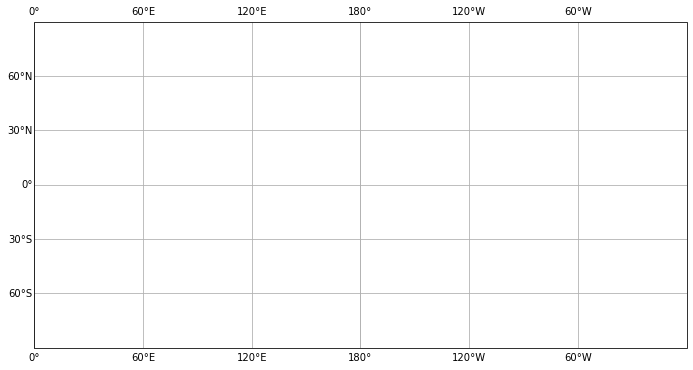

In [19]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# cml = jup_cml[11]
# seangle = -3.098

plt.figure(figsize=(14, 6))
# ax2 = plt.axes(projection=ccrs.Orthographic(central_longitude=cml, central_latitude=seangle))
ax2 = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
# ax2.coastlines(resolution='110m')
gl = ax2.gridlines(draw_labels=True)
gl.top_labels = True
gl.right_labels = True

# plt.imshow(h3p_int_rs, 
#            aspect='equal', 
#            interpolation='none', 
#            cmap='gist_heat',
#            extent=[-150, 150, 146.0669, 189.0669], 
#            norm=colors.PowerNorm(gamma=0.2))
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
# # plt.ylabel('CML (degrees)', fontsize=14)
# plt.title('a) Intensity: H$_3^{+}$', loc='left', fontsize=14)
# plt.colorbar(extend='max', aspect=10, pad=0.005, shrink=0.75).set_label(label='Intensity (Wm$^{-2}$sr$^{-1}$)',size=14)

plt.contour(lat, np.linspace(-90, 90, 19), colors='blue', origin='upper', extent=[-150, 150, 145.0669, 189.0669])
plt.contour(long, np.linspace(0,360,25), colors='cyan', origin='upper', extent=[-150, 150, 145.0669, 189.0669])
# plt.contour(long, np.linspace(0,360,5), colors='blue', origin='upper', extent=[-150, 150, 145.0669, 189.0669])

In [21]:
lat[10]

array([ 0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      ,  0.      ,
        0.      ,  0.      ,  0.      ,  0.      ,  0.      , 67.83225 ,
       67.641426, 67.494835, 67.37231 , 67.26558 , 

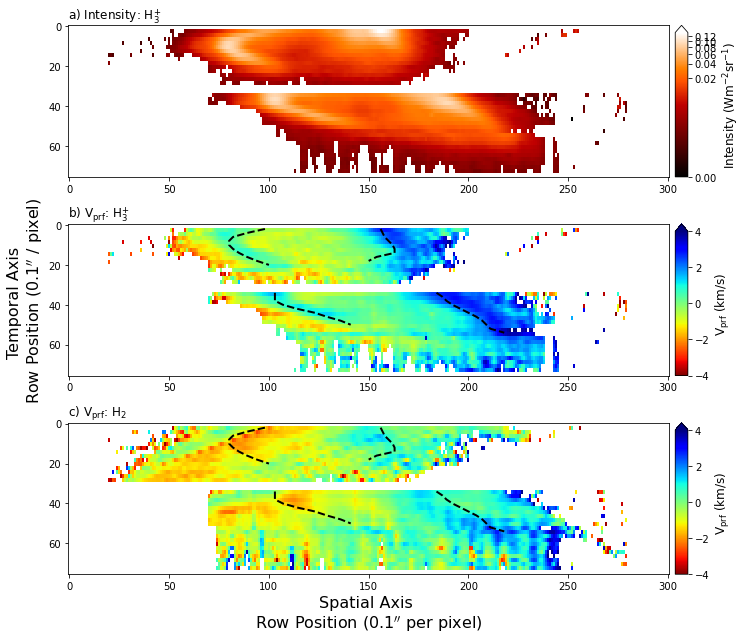

In [22]:
h3p_int_rs = np.array(Image.fromarray(h3p_int).resize(size=(301, 76), resample=0))
h3p_vprf_rs = np.array(Image.fromarray(b2).resize(size=(301, 76), resample=0))
h2_vprf_rs = np.array(Image.fromarray(a2).resize(size=(301, 76), resample=0))
curr_rs = np.array(Image.fromarray(c3).resize(size=(301, 76), resample=0))
curr_min_rs = np.array(Image.fromarray(e3).resize(size=(301, 76), resample=0))

fig = plt.figure(figsize=(18,9), tight_layout=True, facecolor='white')

fig.add_subplot(311)
plt.imshow(h3p_int_rs, aspect='equal', interpolation='none', cmap='gist_heat', norm=colors.PowerNorm(gamma=0.2))
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=12)
# plt.ylabel('Frame Number', fontsize=12)
plt.title('a) Intensity: H$_3^{+}$', loc='left', fontsize=12)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='Intensity (Wm$^{-2}$sr$^{-1}$)',size=12)

fig.add_subplot(312)
plt.imshow(h3p_vprf_rs, aspect='equal', interpolation='none', cmap='jet_r', vmin=-4, vmax=4)
plt.plot(peak1, range(0, len(peak1)*2, 2), ls='--', lw=2, color='black')
plt.plot(peak2, range(0, len(peak2)*2, 2), ls='--', lw=2, color='black')
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=12)
# plt.ylabel('Frame Number', fontsize=12)
plt.ylabel('Temporal Axis \nRow Position (0.1$^{\prime\prime}$ / pixel)', fontsize=16)
plt.title('b) V$_{\mathrm{prf}}$: H$_3^{+}$', loc='left', fontsize=12)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=12)

fig.add_subplot(313)
plt.imshow(h2_vprf_rs, aspect='equal', interpolation='none', cmap='jet_r', vmin=-4, vmax=4)
plt.plot(peak1, range(0, len(peak1)*2, 2), ls='--', lw=2, color='black')
plt.plot(peak2, range(0, len(peak2)*2, 2), ls='--', lw=2, color='black')
plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=16)
# plt.ylabel('Frame Number', fontsize=18)
plt.title('c) V$_{\mathrm{prf}}$: H$_2$', loc='left', fontsize=12)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=12)

# fig.supxlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=12)
# fig.supylabel('Frame Number', fontsize=12)
# plt.savefig(plots_dir+'/h2_h3p_int_vel_map.pdf', dpi=400, bbox_inches='tight', facecolor='white')

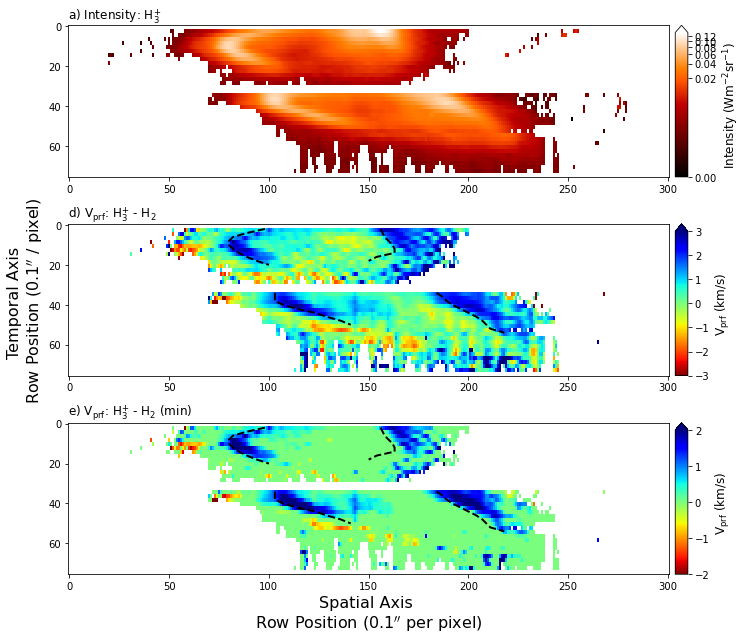

In [9]:
fig = plt.figure(figsize=(18,9), tight_layout=True, facecolor='white')

fig.add_subplot(311)
plt.imshow(h3p_int_rs, aspect='equal', interpolation='none', cmap='gist_heat', norm=colors.PowerNorm(gamma=0.2))
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=12)
# plt.ylabel('Frame Number', fontsize=12)
plt.title('a) Intensity: H$_3^{+}$', loc='left', fontsize=12)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='Intensity (Wm$^{-2}$sr$^{-1}$)',size=12)

# fig.add_subplot(312)
# plt.imshow(h3p_vprf_rs, aspect='equal', cmap='jet_r', vmin=-4, vmax=4)
# plt.plot(peak1, range(0, len(peak1)*2, 2), ls='--', lw=2, color='black')
# plt.plot(peak2, range(0, len(peak2)*2, 2), ls='--', lw=2, color='black')
# # plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=12)
# # plt.ylabel('Frame Number', fontsize=12)
# plt.ylabel('Temporal Axis \nRow Position (0.1$^{\prime\prime}$ / pixel)', fontsize=16)
# plt.title('b) V$_{\mathrm{prf}}$: H$_3^{+}$', loc='left', fontsize=12)
# plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=12)

# fig.add_subplot(313)
# plt.imshow(h2_vprf_rs, aspect='equal', cmap='jet_r', vmin=-4, vmax=4)
# plt.plot(peak1, range(0, len(peak1)*2, 2), ls='--', lw=2, color='black')
# plt.plot(peak2, range(0, len(peak2)*2, 2), ls='--', lw=2, color='black')
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=16)
# # plt.ylabel('Frame Number', fontsize=18)
# plt.title('c) V$_{\mathrm{prf}}$: H$_2$', loc='left', fontsize=12)
# plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=12)

fig.add_subplot(312)
plt.imshow(curr_rs, aspect='equal', interpolation='none', cmap='jet_r', vmin=-3, vmax=3)
plt.plot(peak1, range(0, len(peak1)*2, 2), ls='--', lw=2, color='black')
plt.plot(peak2, range(0, len(peak2)*2, 2), ls='--', lw=2, color='black')
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=12)
# plt.ylabel('Frame Number', fontsize=12, alpha=0)
plt.ylabel('Temporal Axis \nRow Position (0.1$^{\prime\prime}$ / pixel)', fontsize=16)
plt.title('d) V$_{\mathrm{prf}}$: H$_3^{+}$ - H$_2$', loc='left', fontsize=12)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=12)

fig.add_subplot(313)
plt.imshow(curr_min_rs, aspect='equal', interpolation='none', cmap='jet_r', vmin=-2, vmax=2)
plt.plot(peak1, range(0, len(peak1)*2, 2), ls='--', lw=2, color='black')
plt.plot(peak2, range(0, len(peak2)*2, 2), ls='--', lw=2, color='black')
plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=16)
# plt.ylabel('Frame Number', fontsize=10, alpha=0)
plt.title('e) V$_{\mathrm{prf}}$: H$_3^{+}$ - H$_2$ ($\mathrm{min}$)', loc='left', fontsize=12)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=12)

# fig.supxlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=12)
# fig.supylabel('Frame Number', fontsize=12)
# plt.savefig(plots_dir+'/h2_h3p_curr_map.pdf', dpi=400, bbox_inches='tight', facecolor='white')

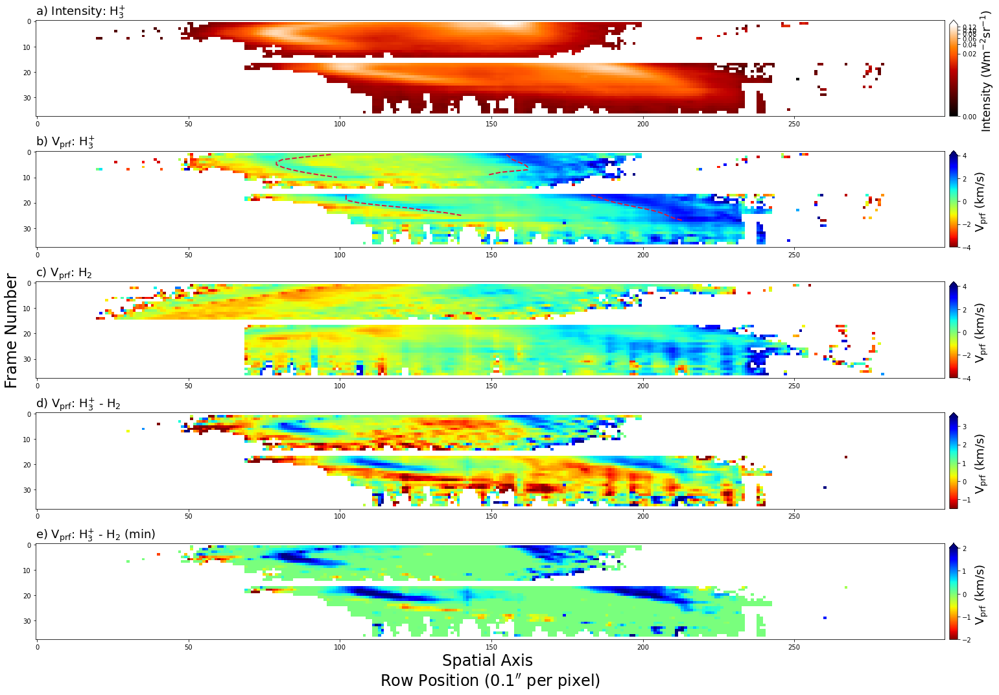

In [13]:
fig = plt.figure(figsize=(24,15), tight_layout=True)

fig.add_subplot(511)
plt.imshow(h3p_int, aspect='auto', cmap='gist_heat', norm=colors.PowerNorm(gamma=0.2))
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
# plt.ylabel('Frame Number', fontsize=18)
plt.title('a) Intensity: H$_3^{+}$', loc='left', fontsize=18)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='Intensity (Wm$^{-2}$sr$^{-1}$)',size=18)

fig.add_subplot(512)
plt.imshow(b2, aspect='auto', cmap='jet_r', vmin=-4, vmax=4)
plt.plot(peak1, range(len(peak1)), ls='--', lw=2, color='crimson')
plt.plot(peak2, range(len(peak2)), ls='--', lw=2, color='crimson')
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
# plt.ylabel('Frame Number', fontsize=18)
plt.title('b) V$_{\mathrm{prf}}$: H$_3^{+}$', loc='left', fontsize=18)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=18)

fig.add_subplot(513)
plt.imshow(a2, aspect='auto', cmap='jet_r', vmin=-4, vmax=4)
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
plt.ylabel('Frame Number', fontsize=24)
plt.title('c) V$_{\mathrm{prf}}$: H$_2$', loc='left', fontsize=18)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=18)

fig.add_subplot(514)
plt.imshow(c3, aspect='auto', cmap='jet_r', vmin=-1.5, vmax=3.5)
# plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
# plt.ylabel('Frame Number', fontsize=18, alpha=0)
plt.title('d) V$_{\mathrm{prf}}$: H$_3^{+}$ - H$_2$', loc='left', fontsize=18)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=18)

fig.add_subplot(515)
plt.imshow(e3, aspect='auto', cmap='jet_r', vmin=-2, vmax=2)
plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=24)
plt.ylabel('Frame Number', fontsize=10, alpha=0)
plt.title('e) V$_{\mathrm{prf}}$: H$_3^{+}$ - H$_2$ ($\mathrm{min}$)', loc='left', fontsize=18)
plt.colorbar(extend='max', aspect=12, pad=0.005).set_label(label='V$_{\mathrm{prf}}$ (km/s)',size=18)

# fig.supxlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=18)
# fig.supylabel('Frame Number', fontsize=18)
# plt.savefig(plots_dir + '/h2_h3p_int_vel_curr_map', dpi=400, bbox_inches='tight', facecolor='white')

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


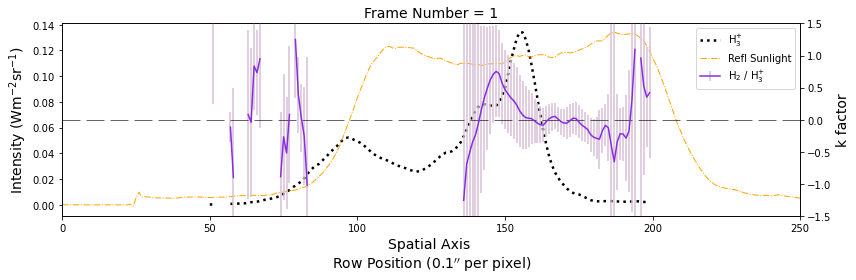

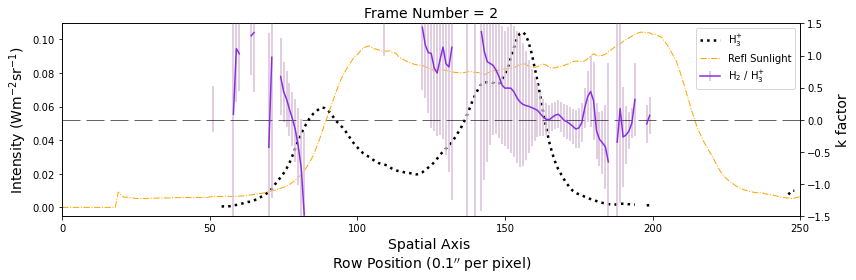

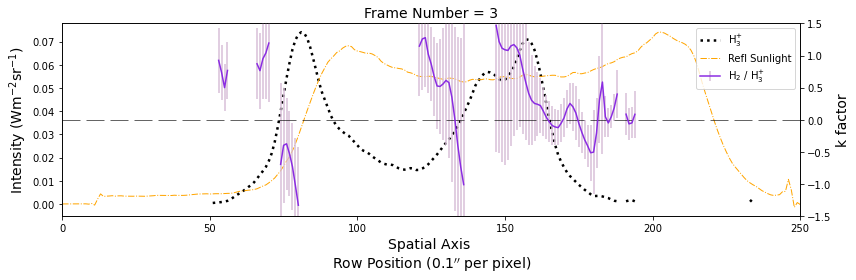

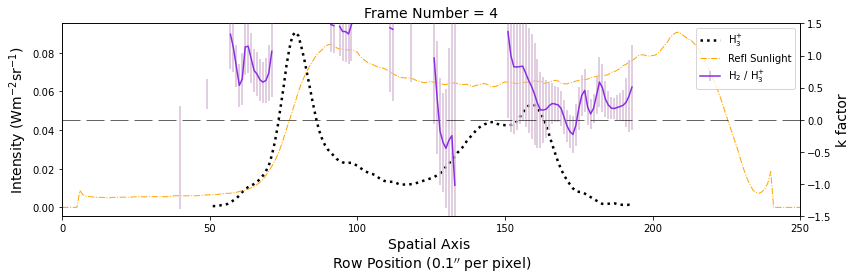

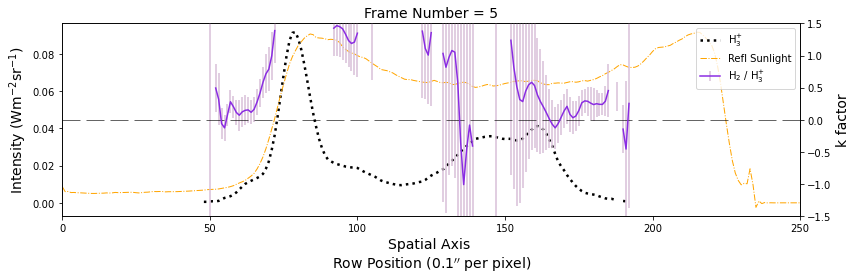

...

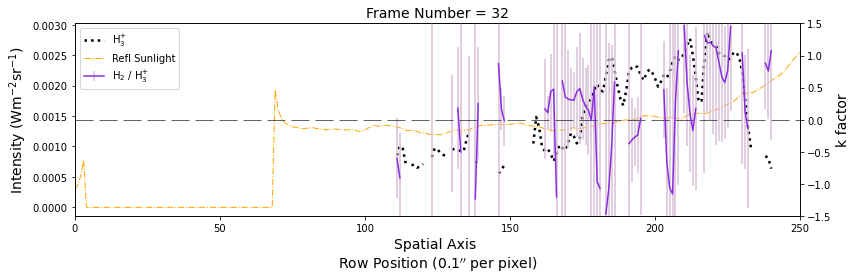

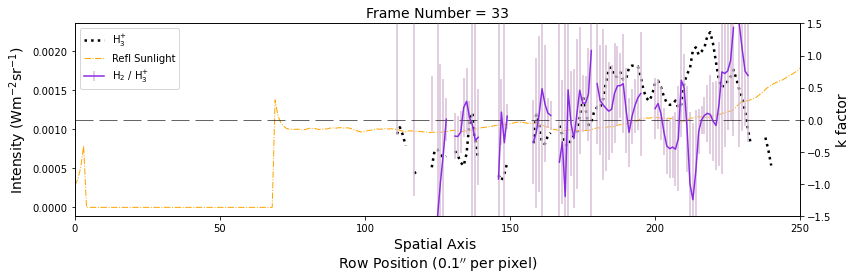

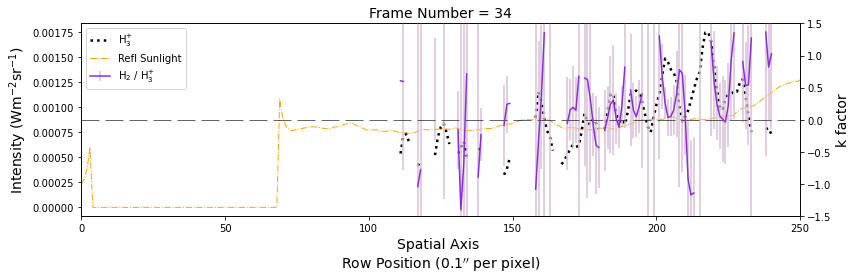

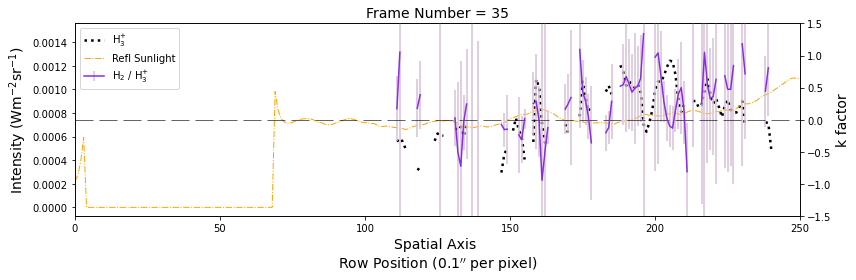

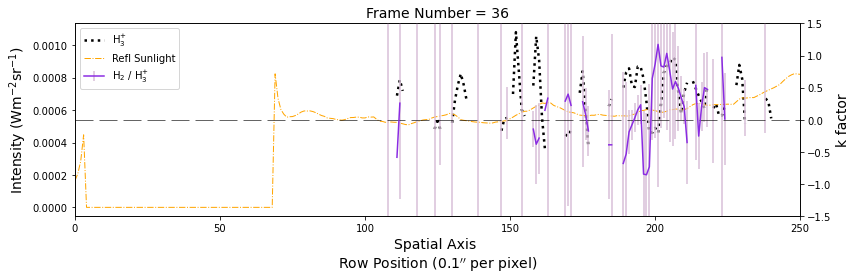

In [7]:
d2 = a2 / b2
d2[d2 > 1.5] = np.nan
d2[d2 < -1.5] = np.nan

errd2 = d2 * np.sqrt((h2_verr / a2)**2 + (h3p_verr / b2)**2)

for i in range(len(h3p_vprf)):
    if i not in (0,15,16,37):  
        xnew = np.linspace(0,299,300)
        int2 = (ref_sun/np.nanmax(ref_sun[i])*np.nanmax(h3p_int[i]))
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('Frame Number = '+ str(i), fontsize=14)
        
        ax2 = ax.twinx()
        ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2.5)
        ax.plot(xnew, int2[i], color='orange', ls='-.', label='Refl Sunlight', lw=1)
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
        ax2.errorbar(xnew, d2[i], yerr=errd2[i], color='blueviolet', ecolor='thistle', label='H$_2$ / H$_3^{+}$')
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)

        # secondary y-axis label
        ax2.set_ylabel('k factor', fontsize=14)
        plt.axhline(y=0, xmin=0, xmax=250, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(0,250)
        plt.ylim(-1.5,1.5)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=0)
        
        plt.tight_layout()
#         plt.savefig(plots_dir + '/h2_h3p_k_fr_' +str(i), dpi=400, bbox_inches='tight', facecolor='white')

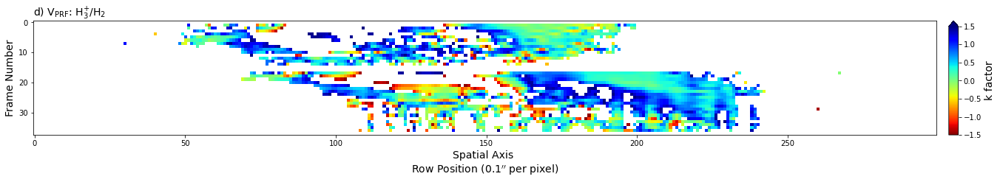

In [35]:
fig = plt.figure(figsize=(24,12), tight_layout=True)

fig.add_subplot(411)
plt.imshow(d2, cmap='jet_r', vmin=-1.5, vmax=1.5)
plt.xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
plt.ylabel('Frame Number', fontsize=14)
plt.title('d) V$_{\mathrm{PRF}}$: H$_3^{+}$/H$_2$', loc='left', fontsize=14)
plt.colorbar(extend='max', aspect=12, pad=0.01).set_label(label='k factor',size=14)

c3 = c2 + 0
c_min = c2 - errc2
c_max = c2 + errc2
c_max_t = c3/c_max
c_min_t = c3/c_min
c_max_t[c_max_t <0] = 0
c_min_t[c_min_t <0] = 0
m3 = c_max_t * c_min_t

m3[m3 > 0] = 1

d3 = c3 * m3
d3a = c_min * m3
d3b = c_max * m3
# c3[d3 > 0] = c_min
# c3[d3 < 0] = c_max

plt.figure(figsize=(20,4))
plt.imshow(c_max_t, vmin=0, vmax=1)
plt.colorbar()

plt.figure(figsize=(20,4))
plt.imshow(c_min_t, vmin=0, vmax=1)
plt.colorbar()
# m3[:] = 0
# m3[c_max_t>0 and c_min_t>0] = c3[c_max_t>0 and c_min_t>0]
# c3[c_min < 0]=0

# c3[c3 > 0] = c_min

# for i in range(len(h3p_vprf)):
for i in range(2):
    if i not in (0,15,16,37):  
        xnew = np.linspace(0,299,300)
#         int2 = (h3p_int/np.nanmax(h3p_int[i])*7.8-3.9)
        
        fig, ax = plt.subplots(figsize = (12, 4))
        plt.title('Frame Number = '+ str(i), fontsize=14)
        
        ax2 = ax.twinx()
#         ax.plot(xnew, h3p_int[i], color='k', ls=':', label='H$_3^{+}$', lw=2)
#         ax2.errorbar(xnew, a2[i], yerr=h2_verr[i], color='red', ecolor='lightsalmon', label='H$_2$')
#         ax2.errorbar(xnew, b2[i], yerr=h3p_verr[i], color='blue', ecolor='lightblue', label='H$_3^{+}$')
#         ax2.errorbar(xnew, d3[i], yerr=errc2[i], color='green', ecolor='lightgreen', label='H$_3^{+}$ - H$_2$')
#         ax.plot(xnew, c3[i]/c_min[i], color='gold', ls='-', label='c3/c_min', lw=2)
#         ax.plot(xnew, c3[i]/c_max[i], color='blue', ls='-', label='c3/c_max', lw=2)
        ax.plot(xnew, d3[i], color='blue', ls='-', label='d3', lw=2)
        
        # giving labels to the axises
        ax.set_xlabel('Spatial Axis \nRow Position (0.1$^{\prime\prime}$ per pixel)', fontsize=14)
        ax.set_ylabel('Intensity (Wm$^{-2}$sr$^{-1}$)', fontsize=14)
        ax.set_ylim(-2,2)

        # secondary y-axis label
        ax2.set_ylabel('V$_{\mathrm{PRF}}$ (km/s)', fontsize=14)
        plt.axhline(y=0, xmin=0, xmax=250, color='black', ls='dashed', dashes=(30, 10), lw=0.6)
        plt.xlim(0,250)
        plt.ylim(-4,4)
        
        lines, labels = ax.get_legend_handles_labels()
        lines2, labels2 = ax2.get_legend_handles_labels()
        ax2.legend(lines + lines2, labels + labels2, loc=0)
        
        plt.tight_layout()
#         plt.savefig(imgpath + '/h2_h3p_int_vel_compare_fr_' +str(i), dpi=400, bbox_inches='tight', facecolor='white')